# Logistic Regression Example

### 生成数据集
#### '<font color="blue">+</font>' 从高斯分布采样 (X, Y) ~ N(3, 6, 1, 1, 0).<br>
#### '<font color="green">o</font>' 从高斯分布采样  (X, Y) ~ N(6, 3, 1, 1, 0)<br>

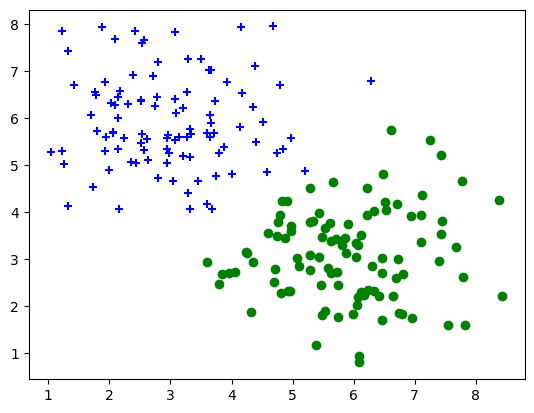

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib.cm as cm
import numpy as np
%matplotlib inline

dot_num = 100
x_p = np.random.normal(3., 1, dot_num)
y_p = np.random.normal(6., 1, dot_num)
y = np.ones(dot_num)
C1 = np.array([x_p, y_p, y]).T

x_n = np.random.normal(6., 1, dot_num)
y_n = np.random.normal(3., 1, dot_num)
y = np.zeros(dot_num)
C2 = np.array([x_n, y_n, y]).T

plt.scatter(C1[:, 0], C1[:, 1], c='b', marker='+')
plt.scatter(C2[:, 0], C2[:, 1], c='g', marker='o')

data_set = np.concatenate((C1, C2), axis=0)
np.random.shuffle(data_set)


## 建立模型
建立模型类，定义loss函数，定义一步梯度下降过程函数

填空一：实现sigmoid的交叉熵损失函数(不使用tf内置的loss 函数)

In [ ]:
import tensorflow as tf  # 添加这行导入 TensorFlow

epsilon = 1e-12

class LogisticRegression():
    def __init__(self):
        self.W = tf.Variable(shape=[2, 1], dtype=tf.float32,
            initial_value=tf.random.uniform(shape=[2, 1], minval=-0.1, maxval=0.1))
        self.b = tf.Variable(shape=[1], dtype=tf.float32, initial_value=tf.zeros(shape=[1]))

        self.trainable_variables = [self.W, self.b]

    @tf.function
    def __call__(self, inp):
        logits = tf.matmul(inp, self.W) + self.b # shape(N, 1)
        pred = tf.nn.sigmoid(logits)
        return pred

@tf.function
def compute_loss(pred, label):
    if not isinstance(label, tf.Tensor):
        label = tf.constant(label, dtype=tf.float32)
    pred = tf.squeeze(pred, axis=1)
    '''============================='''
    # 输入label shape(N,), pred shape(N,)
    # 输出 losses shape(N,) 每一个样本一个loss
    # 实现sigmoid的交叉熵损失函数(不使用tf内置的loss 函数)
    epsilon = 1e-12
    pred = tf.clip_by_value(pred, epsilon, 1. - epsilon)
    losses = - (label * tf.math.log(pred) + (1 - label) * tf.math.log(1 - pred))
    '''============================='''
    loss = tf.reduce_mean(losses)

    pred = tf.where(pred>0.5, tf.ones_like(pred), tf.zeros_like(pred))
    accuracy = tf.reduce_mean(tf.cast(tf.equal(label, pred), dtype=tf.float32))
    return loss, accuracy

@tf.function
def train_one_step(model, optimizer, x, y):
    with tf.GradientTape() as tape:
        pred = model(x)
        loss, accuracy = compute_loss(pred, y)

    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return loss, accuracy, model.W, model.b

### 实例化一个模型，进行训练

In [ ]:
if __name__ == '__main__':
    model = LogisticRegression()
    opt = tf.keras.optimizers.SGD(learning_rate=0.01)
    x1, x2, y = list(zip(*data_set))
    x = list(zip(x1, x2))
    animation_fram = []

    for i in range(200):
        loss, accuracy, W_opt, b_opt = train_one_step(model, opt, x, y)
        animation_fram.append((W_opt.numpy()[0, 0], W_opt.numpy()[1, 0], b_opt.numpy(), loss.numpy()))
        if i%20 == 0:
            print(f'loss: {loss.numpy():.4}\t accuracy: {accuracy.numpy():.4}')

TypeError: in user code:

    File "C:\Users\Henry233\AppData\Local\Temp\ipykernel_37820\443307484.py", line 41, in train_one_step  *
        pred = model(x)
    File "C:\Users\Henry233\AppData\Local\Temp\ipykernel_37820\443307484.py", line 15, in __call__  *
        logits = tf.matmul(inp, self.W) + self.b # shape(N, 1)

    TypeError: Input 'b' of 'MatMul' Op has type float32 that does not match type float64 of argument 'a'.


由于出现了 TypeError: Input 'b' of 'MatMul' Op has type float32 that does not match type float64 of argument 'a'.的错误，所以修改代码:


1.   在__call__方法里，借助 tf.cast(inp, tf.float32) 把输入转换为 float32 类型。
2.   在train_one_step函数中，对输入的 x 和 y 都进行了类型转换，使其变为 float32 类型。




loss: 0.7643	 accuracy: 0.475
loss: 0.5569	 accuracy: 0.995
loss: 0.4383	 accuracy: 0.99
loss: 0.3635	 accuracy: 0.99
loss: 0.3128	 accuracy: 0.99
loss: 0.2764	 accuracy: 0.99
loss: 0.249	 accuracy: 0.99
loss: 0.2277	 accuracy: 0.99
loss: 0.2106	 accuracy: 0.99
loss: 0.1965	 accuracy: 0.99


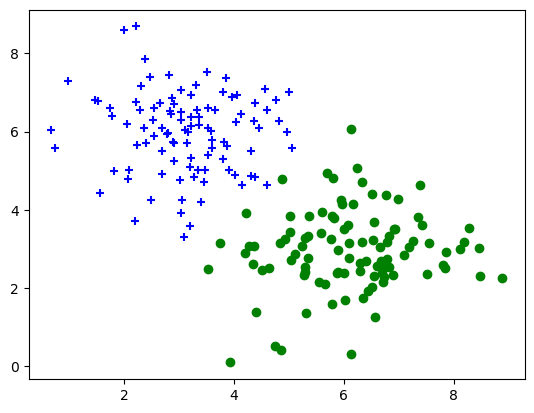

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib.cm as cm
import numpy as np
%matplotlib inline

dot_num = 100
x_p = np.random.normal(3., 1, dot_num)
y_p = np.random.normal(6., 1, dot_num)
y = np.ones(dot_num)
C1 = np.array([x_p, y_p, y]).T

x_n = np.random.normal(6., 1, dot_num)
y_n = np.random.normal(3., 1, dot_num)
y = np.zeros(dot_num)
C2 = np.array([x_n, y_n, y]).T

plt.scatter(C1[:, 0], C1[:, 1], c='b', marker='+')
plt.scatter(C2[:, 0], C2[:, 1], c='g', marker='o')

data_set = np.concatenate((C1, C2), axis=0)
np.random.shuffle(data_set)

class LogisticRegression():
    def __init__(self):
        self.W = tf.Variable(shape=[2, 1], dtype=tf.float32,
            initial_value=tf.random.uniform(shape=[2, 1], minval=-0.1, maxval=0.1))
        self.b = tf.Variable(shape=[1], dtype=tf.float32, initial_value=tf.zeros(shape=[1]))

        self.trainable_variables = [self.W, self.b]

    @tf.function
    def __call__(self, inp):
        # 确保输入是float32类型
        inp = tf.cast(inp, tf.float32)
        logits = tf.matmul(inp, self.W) + self.b # shape(N, 1)
        pred = tf.nn.sigmoid(logits)
        return pred

@tf.function
def compute_loss(pred, label):
    if not isinstance(label, tf.Tensor):
        label = tf.constant(label, dtype=tf.float32)
    pred = tf.squeeze(pred, axis=1)
    '''============================='''
    # 输入label shape(N,), pred shape(N,)
    # 输出 losses shape(N,) 每一个样本一个loss
    # 实现sigmoid的交叉熵损失函数(不使用tf内置的loss 函数)
    epsilon = 1e-12
    pred = tf.clip_by_value(pred, epsilon, 1. - epsilon)
    losses = - (label * tf.math.log(pred) + (1 - label) * tf.math.log(1 - pred))
    '''============================='''
    loss = tf.reduce_mean(losses)

    pred = tf.where(pred>0.5, tf.ones_like(pred), tf.zeros_like(pred))
    accuracy = tf.reduce_mean(tf.cast(tf.equal(label, pred), dtype=tf.float32))
    return loss, accuracy

@tf.function
def train_one_step(model, optimizer, x, y):
    # 确保输入是float32类型
    x = tf.cast(x, tf.float32)
    y = tf.cast(y, tf.float32)

    with tf.GradientTape() as tape:
        pred = model(x)
        loss, accuracy = compute_loss(pred, y)

    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return loss, accuracy, model.W, model.b

if __name__ == '__main__':
    model = LogisticRegression()
    opt = tf.keras.optimizers.SGD(learning_rate=0.01)
    x1, x2, y = list(zip(*data_set))
    x = list(zip(x1, x2))
    animation_fram = []

    for i in range(200):
        loss, accuracy, W_opt, b_opt = train_one_step(model, opt, x, y)
        animation_fram.append((W_opt.numpy()[0, 0], W_opt.numpy()[1, 0], b_opt.numpy(), loss.numpy()))
        if i%20 == 0:
            print(f'loss: {loss.numpy():.4}\t accuracy: {accuracy.numpy():.4}')

## 结果展示，无需填写代码

RuntimeError: Requested MovieWriter (ffmpeg) not available

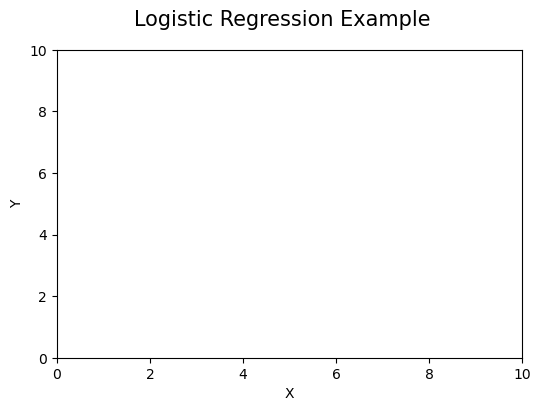

In [ ]:

f, ax = plt.subplots(figsize=(6,4))
f.suptitle('Logistic Regression Example', fontsize=15)
plt.ylabel('Y')
plt.xlabel('X')
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)

line_d, = ax.plot([], [], label='fit_line')
C1_dots, = ax.plot([], [], '+', c='b', label='actual_dots')
C2_dots, = ax.plot([], [], 'o', c='g' ,label='actual_dots')


frame_text = ax.text(0.02, 0.95,'',horizontalalignment='left',verticalalignment='top', transform=ax.transAxes)
# ax.legend()

def init():
    line_d.set_data([],[])
    C1_dots.set_data([],[])
    C2_dots.set_data([],[])
    return (line_d,) + (C1_dots,) + (C2_dots,)

def animate(i):
    xx = np.arange(10, step=0.1)
    a = animation_fram[i][0]
    b = animation_fram[i][1]
    c = animation_fram[i][2]
    yy = a/-b * xx +c/-b
    line_d.set_data(xx, yy)

    C1_dots.set_data(C1[:, 0], C1[:, 1])
    C2_dots.set_data(C2[:, 0], C2[:, 1])

    frame_text.set_text('Timestep = %.1d/%.1d\nLoss = %.3f' % (i, len(animation_fram), animation_fram[i][3]))

    return (line_d,) + (C1_dots,) + (C2_dots,)

anim = animation.FuncAnimation(f, animate, init_func=init,
                               frames=len(animation_fram), interval=30, blit=True)

HTML(anim.to_html5_video())



出现报错：RuntimeError: Requested MovieWriter (ffmpeg) not available
所以使用 JavaScript 动画（HTML）来展示，而不是生成视频。

---

这种方式不需要依赖外部软件。

In [ ]:
f, ax = plt.subplots(figsize=(6,4))
f.suptitle('Logistic Regression Example', fontsize=15)
plt.ylabel('Y')
plt.xlabel('X')
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)

line_d, = ax.plot([], [], label='fit_line')
C1_dots, = ax.plot([], [], '+', c='b', label='C1')
C2_dots, = ax.plot([], [], 'o', c='g' ,label='C2')

frame_text = ax.text(0.02, 0.95, '', horizontalalignment='left',
                    verticalalignment='top', transform=ax.transAxes)
ax.legend()

def init():
    line_d.set_data([],[])
    C1_dots.set_data([],[])
    C2_dots.set_data([],[])
    return line_d, C1_dots, C2_dots

def animate(i):
    xx = np.arange(10, step=0.1)
    a = animation_fram[i][0]
    b = animation_fram[i][1]
    c = animation_fram[i][2]
    yy = a/-b * xx + c/-b
    line_d.set_data(xx, yy)

    C1_dots.set_data(C1[:, 0], C1[:, 1])
    C2_dots.set_data(C2[:, 0], C2[:, 1])

    frame_text.set_text('Timestep = %.1d/%.1d\nLoss = %.3f' % (i, len(animation_fram), animation_fram[i][3]))

    return line_d, C1_dots, C2_dots

# 创建动画
anim = animation.FuncAnimation(f, animate, init_func=init,
                               frames=len(animation_fram), interval=30, blit=True)

# 使用JavaScript渲染动画（不需要FFmpeg）
plt.close()  # 关闭原始图表，避免重复显示
HTML(anim.to_jshtml())  # 使用to_jshtml()替代to_html5_video()